## Requirement Installation

In [1]:
!pip install transformers[torch] datasets -q

## Import Libraries

In [2]:
import requests
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForQuestionAnswering,BlipImageProcessor, AutoProcessor
from transformers import BlipConfig
from datasets import load_dataset
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display


import os 
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## About the Dataset

**PathVQA** is a dataset of question-answer pairs on pathology images. The dataset is intended to be used for training and testing Medical Visual Question Answering (VQA) systems. The dataset includes both open-ended questions and binary "yes/no" questions. The dataset is built from two publicly-available pathology textbooks: "Textbook of Pathology" and "Basic Pathology", and a publicly-available digital library: "Pathology Education Informational Resource" (PEIR). The copyrights of images and captions belong to the publishers and authors of these two books, and the owners of the PEIR digital library.


### Download Dataset

In [4]:
dataset = load_dataset("flaviagiammarino/path-vqa")

Found cached dataset parquet (C:/Users/jonat/.cache/huggingface/datasets/flaviagiammarino___parquet/flaviagiammarino--path-vqa-d899d7933bad79a5/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


  0%|          | 0/3 [00:00<?, ?it/s]

In [5]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 19654
    })
    validation: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6259
    })
    test: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6719
    })
})

## Sample Visualization

Question: what are stained here with an immunohistochemical stain for cytokeratin 7?
Answer: bile duct cells and canals of hering


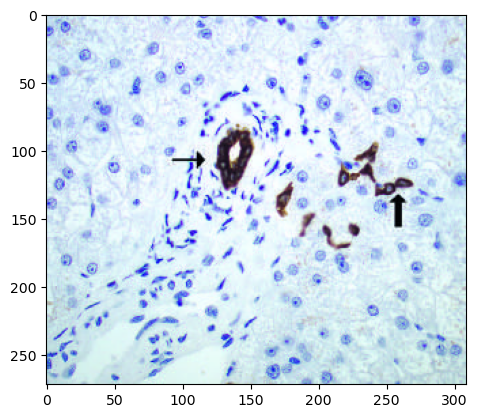

In [6]:
sample = dataset['train'][1]
PIL_image = Image.fromarray(np.array(sample['image'])).convert('RGB')
plt.imshow(sample['image'].convert('RGB'))
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

In [7]:
config = BlipConfig.from_pretrained("Salesforce/blip-vqa-base")

In [8]:
train_data = dataset['train'].select(range(10000))
val_data = dataset['validation'].select(range(1000))

## Build Data-loader
This class is intended to be used for training a VQA model, where each data sample consists of an image and a corresponding question, and the model is trained to generate answers based on the input image and question

In [9]:
class VQADataset(torch.utils.data.Dataset):
    def __init__(self, data, segment, text_processor, image_processor):
        self.data = data
        self.questions = data['question']
        self.answers = data['answer']
        self.text_processor = text_processor
        self.image_processor = image_processor
        self.max_length = 32
        self.image_height = 128
        self.image_width = 128

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # get image + text
        answers = self.answers[idx]
        questions = self.questions[idx]
        image = self.data[idx]['image'].convert('RGB')
        text = self.questions[idx]

        image_encoding = self.image_processor(image,
                                  do_resize=True,
                                  size=(self.image_height,self.image_width),
                                  return_tensors="pt")

        encoding = self.text_processor(
                                  None,
                                  text,
                                  padding="max_length",
                                  truncation=True,
                                  max_length = self.max_length,
                                  return_tensors="pt"
                                  )
        # # remove batch dimension
        for k,v in encoding.items():
            encoding[k] = v.squeeze()
        encoding["pixel_values"] = image_encoding["pixel_values"][0]
        # # add labels
        labels = self.text_processor.tokenizer.encode(
            answers,
            max_length= self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors='pt'
        )[0]
        encoding["labels"] = labels

        return encoding

Load Pretrained Text and Image Processor

In [10]:
text_processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
image_processor = BlipImageProcessor.from_pretrained("Salesforce/blip-vqa-base")

Using Class Dataloader to load train and val data

In [11]:
train_vqa_dataset = VQADataset(data=train_data,
                     segment='train',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

val_vqa_dataset = VQADataset(data=train_data,
                     segment='validation',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

In [12]:
train_vqa_dataset[0]

{'input_ids': tensor([  101,  2073,  2024, 11290,  7872,  4442,  1006,  9242,  4442,  1007,
         2284,  1029,   102,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[0.6895, 0.8647, 0.9814,  ..., 0.9668, 1.2150, 1.4194],
         [1.0252, 0.9814, 1.0106,  ..., 1.0398, 1.3902, 1.2880],
         [0.9960, 1.0836, 0.8501,  ..., 1.0398, 1.2442, 1.1420],
         ...,
         [0.9668, 0.5581, 0.0617,  ..., 1.0106, 0.9376, 0.8792],
         [0.7917, 0.9960, 0.8647,  ..., 1.1420, 1.0252, 0.9230],
         [0.5581, 0.9522, 0.9376,  ..., 1.1420, 0.9376, 0.9668]],

        [[1.1594, 1.3995, 1.5196,  ..., 1.3695, 1.6247, 1.8948],
         [1.5946, 1.4746, 1.5046,  ..., 1.4446, 1.8047, 1.6847],
         [1.5196, 1.5946, 1.5196,  ..., 1.47

Build Custom Collate and Batch

In [13]:
def collate_fn(batch):
    input_ids = [item['input_ids'] for item in batch]
    pixel_values = [item['pixel_values'] for item in batch]
    attention_mask = [item['attention_mask'] for item in batch]
    labels = [item['labels'] for item in batch]
    # create new batch
    batch = {}
    batch['input_ids'] = torch.stack(input_ids)
    batch['attention_mask'] = torch.stack(attention_mask)
    batch['pixel_values'] = torch.stack(pixel_values)
    batch['labels'] = torch.stack(labels)

    return batch

train_dataloader = DataLoader(train_vqa_dataset,
                              collate_fn=collate_fn,
                              batch_size=64,
                              shuffle=False)
val_dataloader = DataLoader(val_vqa_dataset,
                            collate_fn=collate_fn,
                            batch_size=64,
                            shuffle=False)

In [14]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
    print(k, v.shape)

input_ids torch.Size([64, 32])
attention_mask torch.Size([64, 32])
pixel_values torch.Size([64, 3, 128, 128])
labels torch.Size([64, 32])


## Build Model

Load Pretrained Transformer Model BLIP

In [15]:
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base" )
model.to(device)

BlipForQuestionAnswering(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-05, e

Build Optimizer and other params

In [16]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
image_mean = image_processor.image_mean
image_std = image_processor.image_std

Question:  [CLS] what are stained here with an immunohistochemical stain for cytokeratin 7? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Answer:  [CLS] bile duct cells and canals of hering [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


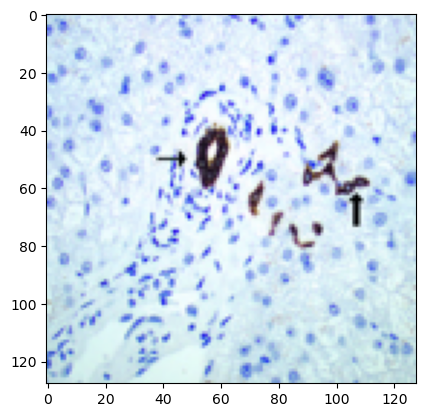

In [17]:
batch_idx = 1

unnormalized_image = (batch["pixel_values"][batch_idx].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)

print("Question: ",text_processor.decode(batch["input_ids"][batch_idx]))
print("Answer: ",text_processor.decode(batch["labels"][batch_idx]))
plt.imshow(Image.fromarray(unnormalized_image))

## Model Training

Fine Tuning Model With Prepared Dataset

In [18]:
model.train()
for epoch in range(45):
    print(f"Epoch: {epoch}")
    total_loss = []
    for batch in tqdm(train_dataloader):
        # get the inputs;
        batch = {k:v.to(device) for k,v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        total_loss.append(loss.item())
        loss.backward()
        optimizer.step()
    print("Loss:", sum(total_loss))

Epoch: 0


  0%|          | 0/157 [00:00<?, ?it/s]

We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


Loss: 576.4169739484787
Epoch: 1


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 258.14590287208557
Epoch: 2


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 249.76913249492645
Epoch: 3


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 243.82613563537598
Epoch: 4


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 239.0141613483429
Epoch: 5


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 234.8866102695465
Epoch: 6


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 232.40858733654022
Epoch: 7


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 230.20386731624603
Epoch: 8


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 228.29416596889496
Epoch: 9


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 226.94546341896057
Epoch: 10


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 225.90907526016235
Epoch: 11


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 225.25279116630554
Epoch: 12


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 224.20636343955994
Epoch: 13


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.96489596366882
Epoch: 14


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.61404883861542
Epoch: 15


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.410222530365
Epoch: 16


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.96878576278687
Epoch: 17


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.43815553188324
Epoch: 18


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.28825223445892
Epoch: 19


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.4467384815216
Epoch: 20


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.2768111228943
Epoch: 21


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.7204030752182
Epoch: 22


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.1037163734436
Epoch: 23


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.5980931520462
Epoch: 24


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.5943294763565
Epoch: 25


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.7305370569229
Epoch: 26


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.00442790985107
Epoch: 27


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.8640432357788
Epoch: 28


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.91205620765686
Epoch: 29


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.47834706306458
Epoch: 30


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.25560343265533
Epoch: 31


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.09960460662842
Epoch: 32


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.14008033275604
Epoch: 33


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.11064565181732
Epoch: 34


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.60231578350067
Epoch: 35


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.96512639522552
Epoch: 36


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.9750621318817
Epoch: 37


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.8511621952057
Epoch: 38


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.50970697402954
Epoch: 39


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.87120473384857
Epoch: 40


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.34077072143555
Epoch: 41


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.85847771167755
Epoch: 42


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.40107786655426
Epoch: 43


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.35146152973175
Epoch: 44


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.3781613111496


## Inference
Test the trained / fine-tuned model for predict result

Question:  where are liver stem cells ( oval cells ) located?
Predicted Answer:  no
Actual Answer:  in the canals of hering


C:\Users\jonat\anaconda3\Lib\site-packages\transformers\generation\utils.py:1254: UserWarning: Using the model-agnostic default `max_length` (=20) to control thegeneration length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


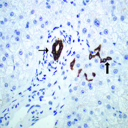

###################################################################
Question:  what are stained here with an immunohistochemical stain for cytokeratin 7?
Predicted Answer:  bile duct cells and canals of hering
Actual Answer:  bile duct cells and canals of hering


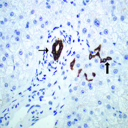

###################################################################
Question:  what do the areas of white chalky deposits represent?
Predicted Answer:  foci of fat necrosis
Actual Answer:  foci of fat necrosis


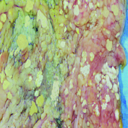

###################################################################
Question:  is embolus derived from a lower - extremity deep venous thrombus lodged in a pulmonary artery branch?
Predicted Answer:  yes
Actual Answer:  yes


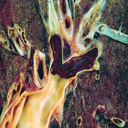

###################################################################
Question:  how is hyperplasia without atypia characterized?
Predicted Answer:  by palisaded histiocytes
Actual Answer:  by nests of closely packed glands


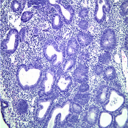

###################################################################
Question:  is normal palmar creases present?
Predicted Answer:  no
Actual Answer:  no


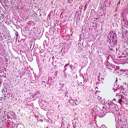

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


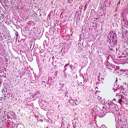

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


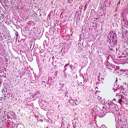

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  esophagus


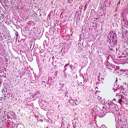

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  varices


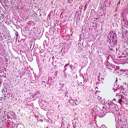

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  excellent photo typical adenocarcinoma extending through muscularis to serosa


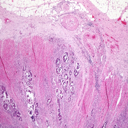

###################################################################
Question:  does this image show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  yes
Actual Answer:  yes


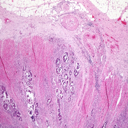

###################################################################
Question:  does typical tuberculous exudate show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  no
Actual Answer:  no


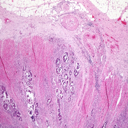

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


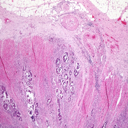

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


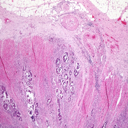

###################################################################
Question:  is hyperplasia without atypia characterized by nests of closely packed glands?
Predicted Answer:  no
Actual Answer:  yes


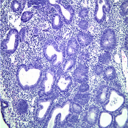

###################################################################
Question:  is mucoepidermoid carcinoma present?
Predicted Answer:  no
Actual Answer:  no


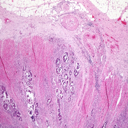

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


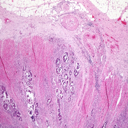

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


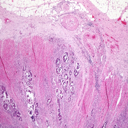

###################################################################
Question:  is edema present?
Predicted Answer:  no
Actual Answer:  no


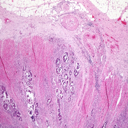

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


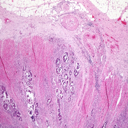

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


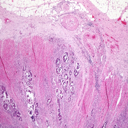

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


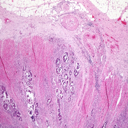

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  typical infiltrating adenocarcinoma


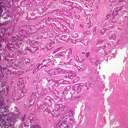

###################################################################
Question:  does this image show typical infiltrating adenocarcinoma?
Predicted Answer:  yes
Actual Answer:  yes


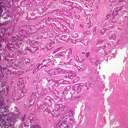

###################################################################
Question:  does retroperitoneal leiomyosarcoma show typical infiltrating adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


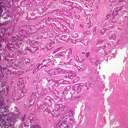

###################################################################
Question:  is endoscopic view of a longitudinally - oriented mallory - weiss characterized by nests of closely packed glands?
Predicted Answer:  no
Actual Answer:  no


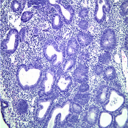

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


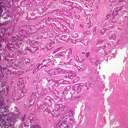

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


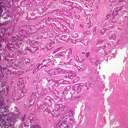

###################################################################
Question:  is adrenal present?
Predicted Answer:  no
Actual Answer:  no


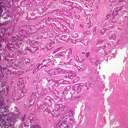

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


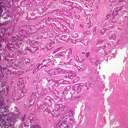

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


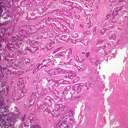

###################################################################
Question:  is coronary artery anomalous origin left from pulmonary artery present?
Predicted Answer:  no
Actual Answer:  no


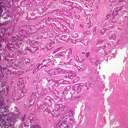

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


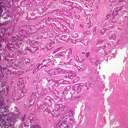

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


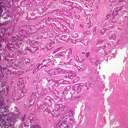

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


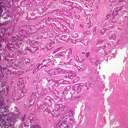

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  typical histology for colon adenocarcinoma


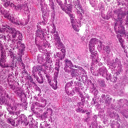

###################################################################
Question:  what is seen as glandular crowding and cellular atypia?
Predicted Answer:  no chromosomal defects
Actual Answer:  hyperplasia without atypia


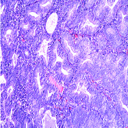

###################################################################
Question:  does this image show typical histology for colon adenocarcinoma?
Predicted Answer:  yes
Actual Answer:  yes


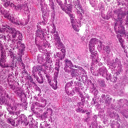

###################################################################
Question:  does amyloid angiopathy r. endocrine show typical histology for colon adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


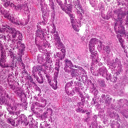

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


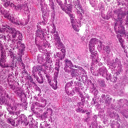

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


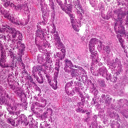

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


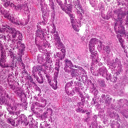

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


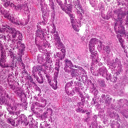

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


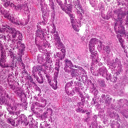

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


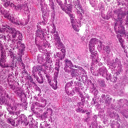

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


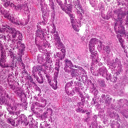

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


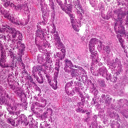

###################################################################
Question:  what is hyperplasia with atypia seen as?
Predicted Answer:  no
Actual Answer:  glandular crowding and cellular atypia


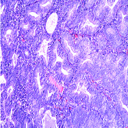

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


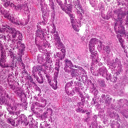

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  typical excellent pinworm


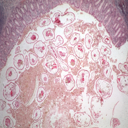

###################################################################
Question:  does this image show typical excellent pinworm?
Predicted Answer:  yes
Actual Answer:  yes


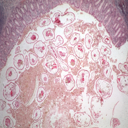

###################################################################
Question:  does acid show typical excellent pinworm?
Predicted Answer:  no
Actual Answer:  no


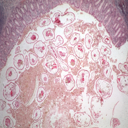

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


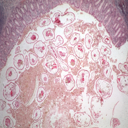

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


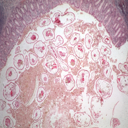

###################################################################
Question:  is myocardium present?
Predicted Answer:  no
Actual Answer:  no


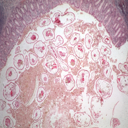

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  appendix


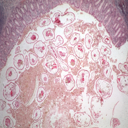

###################################################################
Question:  is appendix present?
Predicted Answer:  no
Actual Answer:  yes


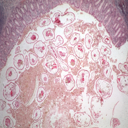

###################################################################
Question:  is carcinoma metastatic lung present?
Predicted Answer:  no
Actual Answer:  no


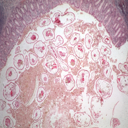

###################################################################
Question:  is hyperplasia with atypia seen as glandular crowding and cellular atypia?
Predicted Answer:  no
Actual Answer:  yes


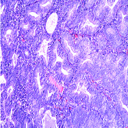

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  pinworm


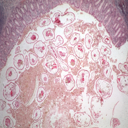

###################################################################
Question:  is pinworm present?
Predicted Answer:  no
Actual Answer:  yes


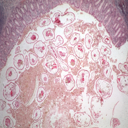

###################################################################
Question:  is normal ovary present?
Predicted Answer:  no
Actual Answer:  no


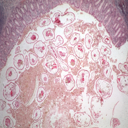

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


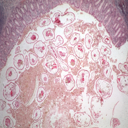

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


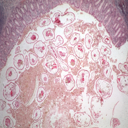

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  appendix


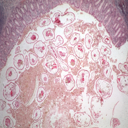

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  pinworm


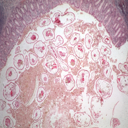

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  trophozoite source


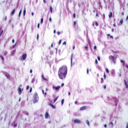

###################################################################
Question:  does this image show trophozoite source?
Predicted Answer:  yes
Actual Answer:  yes


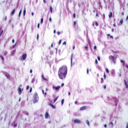

###################################################################
Question:  does glomerulosa show trophozoite source?
Predicted Answer:  no
Actual Answer:  no


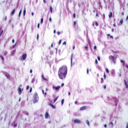

###################################################################
Question:  is a binucleate reed - sternberg cell with large, inclusion - like nucleoli and abundant cytoplasm seen as glandular
Predicted Answer:  no
Actual Answer:  no


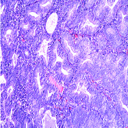

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


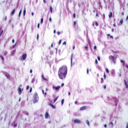

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


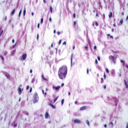

###################################################################
Question:  is metastatic carcinoma prostate present?
Predicted Answer:  no
Actual Answer:  no


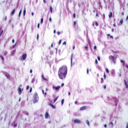

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


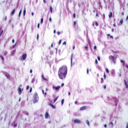

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


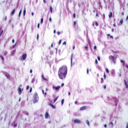

###################################################################
Question:  is appendix present?
Predicted Answer:  no
Actual Answer:  no


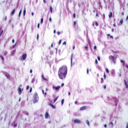

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  amebiasis


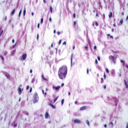

###################################################################
Question:  is amebiasis present?
Predicted Answer:  no
Actual Answer:  yes


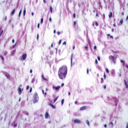

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


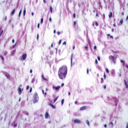

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


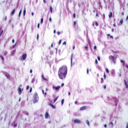

###################################################################
Question:  what shows bundles of normal - looking smooth muscle cells?
Predicted Answer:  microscopic appearance of leiomyoma
Actual Answer:  microscopic appearance of leiomyoma


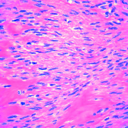

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


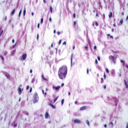

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


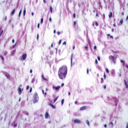

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  amebiasis


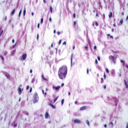

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  inclusion bodies


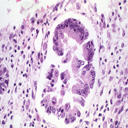

###################################################################
Question:  does this image show inclusion bodies?
Predicted Answer:  no
Actual Answer:  yes


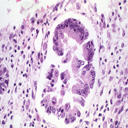

###################################################################
Question:  does atrophy show inclusion bodies?
Predicted Answer:  no
Actual Answer:  no


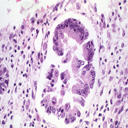

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


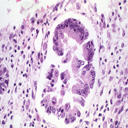

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


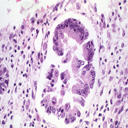

###################################################################
Question:  is antitrypsin present?
Predicted Answer:  no
Actual Answer:  no


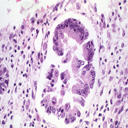

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  stomach


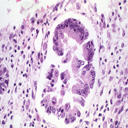

###################################################################
Question:  what does the microscopic appearance of leiomyoma show?
Predicted Answer:  no chromosomal defects
Actual Answer:  bundles of normal - looking smooth muscle cells


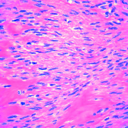

###################################################################
Question:  is stomach present?
Predicted Answer:  no
Actual Answer:  yes


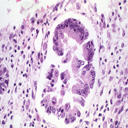

###################################################################
Question:  is cranial artery present?
Predicted Answer:  no
Actual Answer:  no


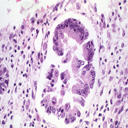

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  cytomegalovirus


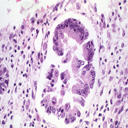

###################################################################
Question:  is cytomegalovirus present?
Predicted Answer:  no
Actual Answer:  yes


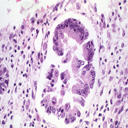

###################################################################
Question:  is acute lymphocytic leukemia present?
Predicted Answer:  no
Actual Answer:  no


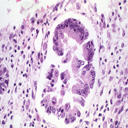

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


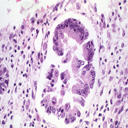

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


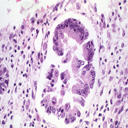

###################################################################


In [19]:
# add batch dimension + move to GPU|
for x in range(100):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Question:  is cytomegalovirus present?
Predicted Answer:  no
Actual Answer:  no


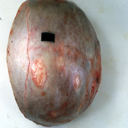

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  metastatic pancreas carcinoma


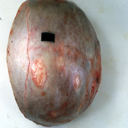

###################################################################
Question:  is metastatic pancreas carcinoma present?
Predicted Answer:  no
Actual Answer:  yes


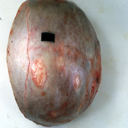

###################################################################
Question:  do the principal cellular alterations that characterize reversible cell injury and necrosis include flat epithelial atypia, adh, and dc
Predicted Answer:  no
Actual Answer:  no


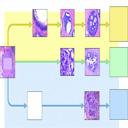

###################################################################
Question:  is eye present?
Predicted Answer:  no
Actual Answer:  no


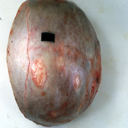

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


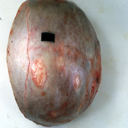

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  metastatic pancreas carcinoma


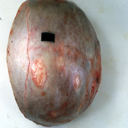

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  several rather large lesions


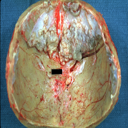

###################################################################
Question:  does this image show several rather large lesions?
Predicted Answer:  yes
Actual Answer:  yes


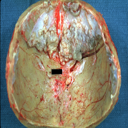

###################################################################
Question:  does opened base of skull with brain show several rather large lesions?
Predicted Answer:  no
Actual Answer:  no


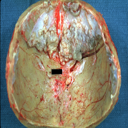

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


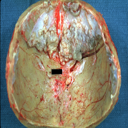

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


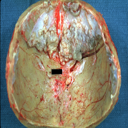

###################################################################
Question:  is medial aspect present?
Predicted Answer:  no
Actual Answer:  no


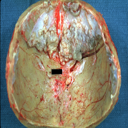

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  exostosis


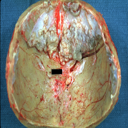

###################################################################
Question:  what are classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  er - positive carcinomas


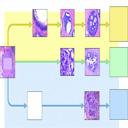

###################################################################
Question:  is exostosis present?
Predicted Answer:  no
Actual Answer:  yes


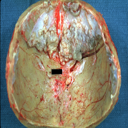

###################################################################
Question:  is umbilical cord present?
Predicted Answer:  no
Actual Answer:  no


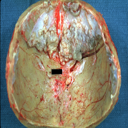

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


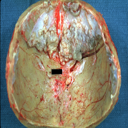

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  exostosis


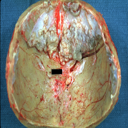

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  close - up view of base of skull with several well shown fractures


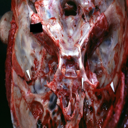

###################################################################
Question:  how does this image show close - up view of base of skull?
Predicted Answer:  with terminal candida infection
Actual Answer:  with several well shown fractures


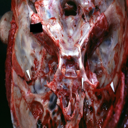

###################################################################
Question:  does this image show close - up view of base of skull with several well shown fractures?
Predicted Answer:  yes
Actual Answer:  yes


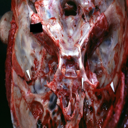

###################################################################
Question:  does amyloid angiopathy r. endocrine show close - up view of base of skull with several well shown fractures?
Predicted Answer:  no
Actual Answer:  no


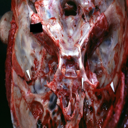

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


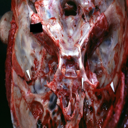

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


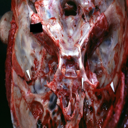

###################################################################
Question:  are these cancers classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  yes


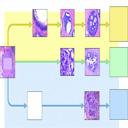

###################################################################
Question:  is myoma lesion present?
Predicted Answer:  no
Actual Answer:  no


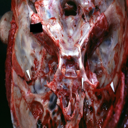

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


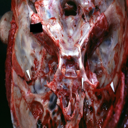

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


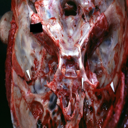

###################################################################
Question:  is hemorrhagic corpus luteum present?
Predicted Answer:  no
Actual Answer:  no


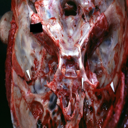

###################################################################
Question:  what well shown fractures?
Predicted Answer:  exposure
Actual Answer:  close - up view of base of skull with several


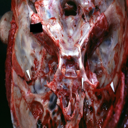

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


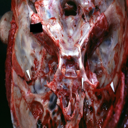

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


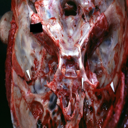

###################################################################
Question:  how is close - up view of base of skull with shown shown fractures?
Predicted Answer:  several
Actual Answer:  several


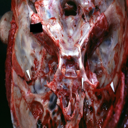

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  close - up view of lesions slide which is brain from case


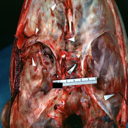

###################################################################
Question:  does this image show close - up view of lesions slide which is brain from this case?
Predicted Answer:  yes
Actual Answer:  yes


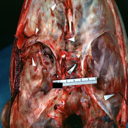

###################################################################
Question:  are skin stem cells classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  no


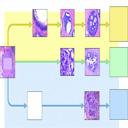

###################################################################
Question:  does inflamed exocervix show close - up view of lesions slide which is brain from this case?
Predicted Answer:  no
Actual Answer:  no


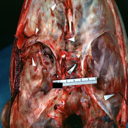

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


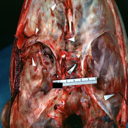

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


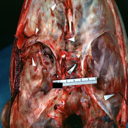

###################################################################
Question:  is focal hemorrhagic infarction well shown present?
Predicted Answer:  no
Actual Answer:  no


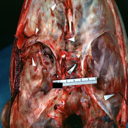

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


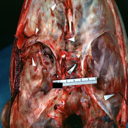

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


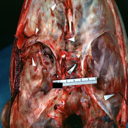

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


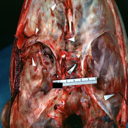

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


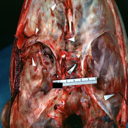

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


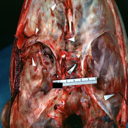

###################################################################
Question:  what is slide?
Predicted Answer:  fractures
Actual Answer:  fractures brain which and close - up view of these fractures


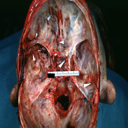

###################################################################
Question:  what is the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  luminal


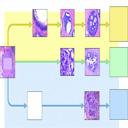

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  fractures
Actual Answer:  fractures


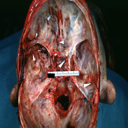

###################################################################
Question:  is fractures brain which is slide and close - up view of these fractures slide?
Predicted Answer:  yes
Actual Answer:  yes


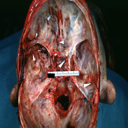

###################################################################
Question:  is lateral view of head with ear lobe crease and web neck other photos in file slide?
Predicted Answer:  no
Actual Answer:  no


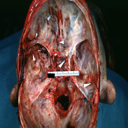

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  fractures brain which is slide and close - up view of these fractures is slide


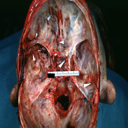

###################################################################
Question:  does this image show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  yes
Actual Answer:  yes


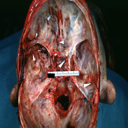

###################################################################
Question:  does nipple duplication show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  no
Actual Answer:  no


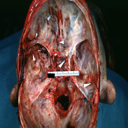

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


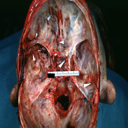

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


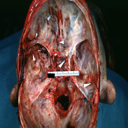

###################################################################
Question:  is intraductal papillomatosis with apocrine metaplasia present?
Predicted Answer:  no
Actual Answer:  no


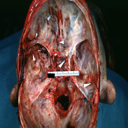

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


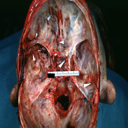

###################################################################
Question:  is the remote kidney infarct replaced by a large fibrotic scar?
Predicted Answer:  no
Actual Answer:  yes


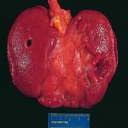

###################################################################
Question:  is this the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  yes


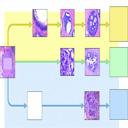

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


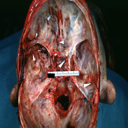

###################################################################
Question:  is acid present?
Predicted Answer:  no
Actual Answer:  no


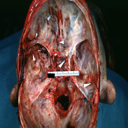

###################################################################
Question:  what is slide?
Predicted Answer:  fractures
Actual Answer:  fractures brain which and close - up view of these fractures


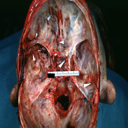

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  fractures
Actual Answer:  fractures


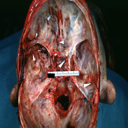

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


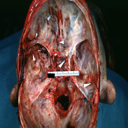

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


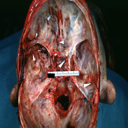

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  head tilted with mouth


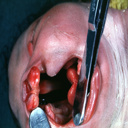

###################################################################
Question:  how does this image show head tilted?
Predicted Answer:  with huge fat necrosis lymphoma
Actual Answer:  with mouth


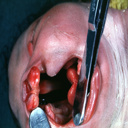

###################################################################
Question:  does this image show head tilted with mouth?
Predicted Answer:  yes
Actual Answer:  yes


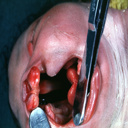

###################################################################
Question:  does anencephaly show head tilted with mouth?
Predicted Answer:  no
Actual Answer:  no


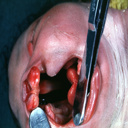

###################################################################
Question:  is show flow cytometry the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  no


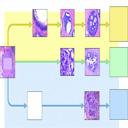

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  face


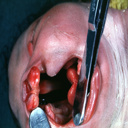

###################################################################
Question:  is face present?
Predicted Answer:  no
Actual Answer:  yes


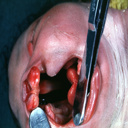

###################################################################
Question:  is opened uterus and cervix with large cervical myoma protruding into vagina slide present?
Predicted Answer:  no
Actual Answer:  no


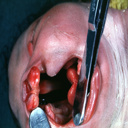

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bilateral cleft palate


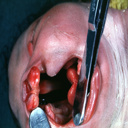

###################################################################
Question:  is bilateral cleft palate present?
Predicted Answer:  yes
Actual Answer:  yes


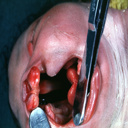

###################################################################
Question:  is newborn cord around neck present?
Predicted Answer:  no
Actual Answer:  no


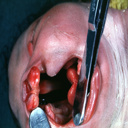

###################################################################
Question:  what opened to show large defect very good illustration of this lesion?
Predicted Answer:  no chromosomal defects
Actual Answer:  head tilted with mouth


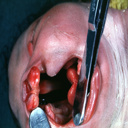

###################################################################
Question:  what is head tilted with mouth opened?
Predicted Answer:  no
Actual Answer:  to show large defect very good illustration of this lesion


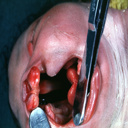

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  face


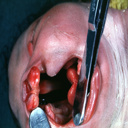

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bilateral cleft palate


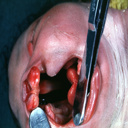

###################################################################
Question:  what is atypical apocrine adenosis, which shares features with apocrine dcis?
Predicted Answer:  no
Actual Answer:  a possible precursor lesion


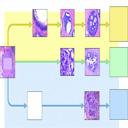

###################################################################
Question:  how is head tilted with mouth opened to show defect very good illustration of this lesion?
Predicted Answer:  large
Actual Answer:  large


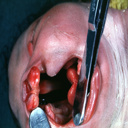

###################################################################
Question:  how is head tilted with mouth opened to show large defect very illustration of this lesion?
Predicted Answer:  malignant
Actual Answer:  good


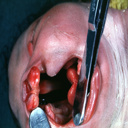

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


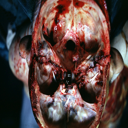

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


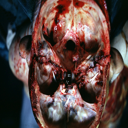

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


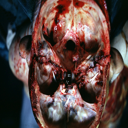

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


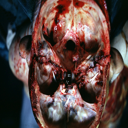

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


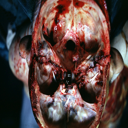

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


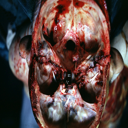

###################################################################
Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  multiple fractures very well


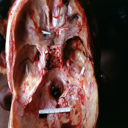

###################################################################
Question:  does this image show multiple fractures very well?
Predicted Answer:  yes
Actual Answer:  yes


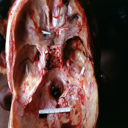

###################################################################
Question:  what is a possible precursor lesion, which shares features with apocrine dcis?
Predicted Answer:  no
Actual Answer:  atypical apocrine adenosis


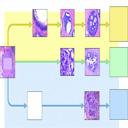

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone


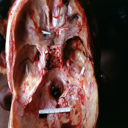

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


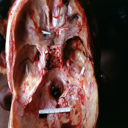

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


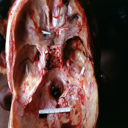

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


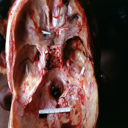

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  bone, calvarium


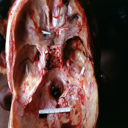

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  basilar skull fracture


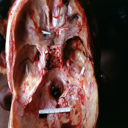

###################################################################
Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  face


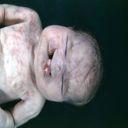

###################################################################


In [20]:
for x in range(500,600):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Test Model With Single Custom Data

Question:  what is present?
Predicted Answer:  no chromosomal defects
Actual Answer:  potters facies


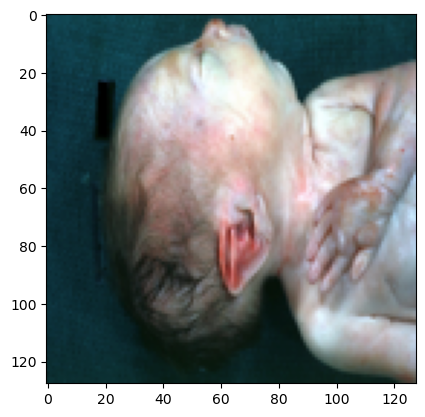

In [21]:
idx = 751
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  does this image show stenosis of foramen magnum due to subluxation of atlas vertebra case 31?
Predicted Answer:  yes
Actual Answer:  yes


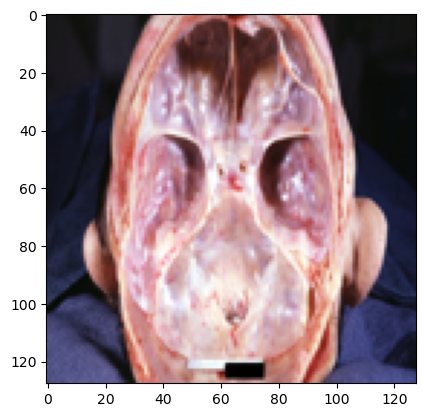

In [22]:
idx = 700
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is beckwith - wiedemann syndrome present?
Predicted Answer:  no
Actual Answer:  no


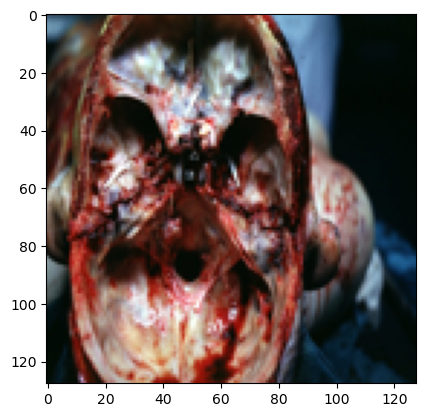

In [23]:
idx = 720
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is thymus present?
Predicted Answer:  no
Actual Answer:  yes


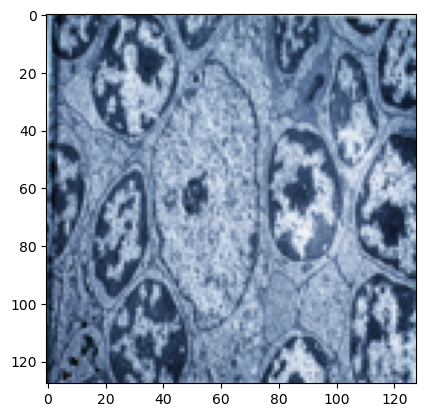

In [24]:
idx = 790
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  where is this part in?
Predicted Answer:  no chromosomal defects
Actual Answer:  spleen


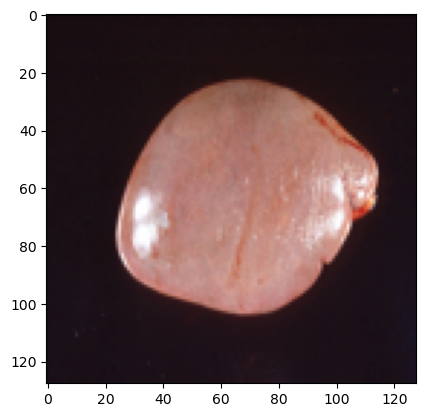

In [25]:
idx = 885
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  does this image show spleen, normal?
Predicted Answer:  yes
Actual Answer:  yes


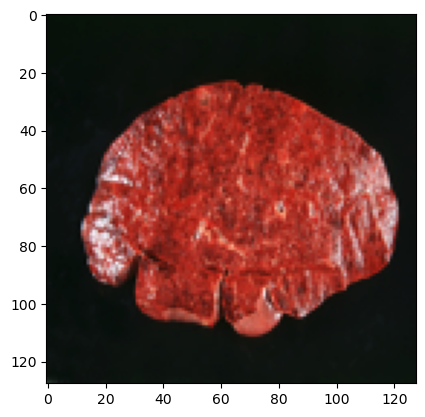

In [26]:
idx = 822
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  what does this image show?
Predicted Answer:  no chromosomal defects
Actual Answer:  x - ray showing large sella turcica


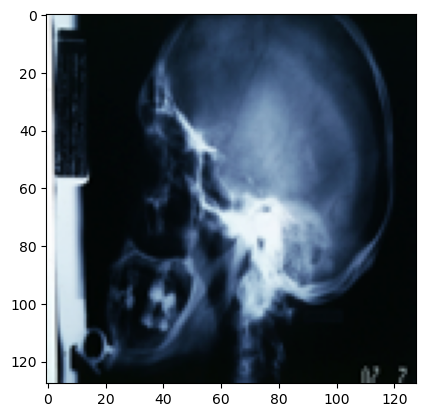

In [27]:
idx = 770
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is chromophobe adenoma present?
Predicted Answer:  no
Actual Answer:  yes


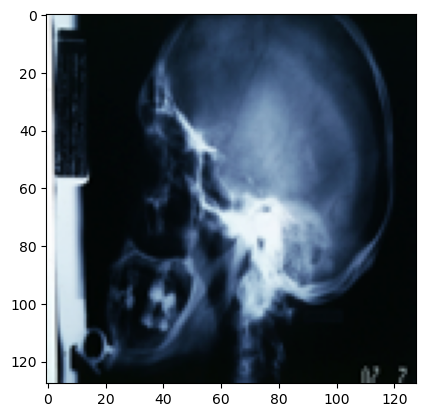

In [28]:
idx = 777
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

## Save Model

After Training Model and Inference, the model is saved using Torch Library in pkl file.

In [32]:
torch.save(model, "model2.pkl")


## Load The Saved Model 
This step aims to ensure that the saved model will work properly when reloaded, especially during deployment.

In [34]:
models = torch.load("model2.pkl")

## Use Loaded Model for Inference

Question:  where are liver stem cells ( oval cells ) located?
Predicted Answer:  no
Actual Answer:  in the canals of hering


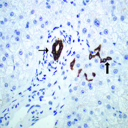

###################################################################
Question:  what are stained here with an immunohistochemical stain for cytokeratin 7?
Predicted Answer:  bile duct cells and canals of hering
Actual Answer:  bile duct cells and canals of hering


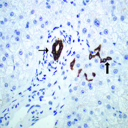

###################################################################
Question:  what do the areas of white chalky deposits represent?
Predicted Answer:  foci of fat necrosis
Actual Answer:  foci of fat necrosis


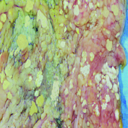

###################################################################
Question:  is embolus derived from a lower - extremity deep venous thrombus lodged in a pulmonary artery branch?
Predicted Answer:  yes
Actual Answer:  yes


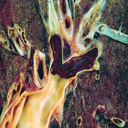

###################################################################
Question:  how is hyperplasia without atypia characterized?
Predicted Answer:  by palisaded histiocytes
Actual Answer:  by nests of closely packed glands


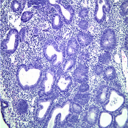

###################################################################
Question:  is normal palmar creases present?
Predicted Answer:  no
Actual Answer:  no


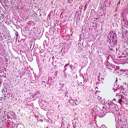

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


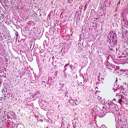

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


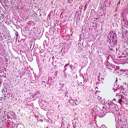

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  esophagus


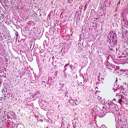

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  varices


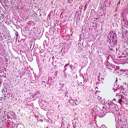

###################################################################


In [35]:
# add batch dimension + move to GPU|
for x in range(10):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = models.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Done